In [1]:
# -*- coding: utf-8 -*-
import os 
import numpy as np
from sklearn.model_selection import StratifiedKFold
#from sklearn import model_selection
import cv2

In [2]:
pwd

'/home/ubuntu/gcubme4/Workspace/HM_LEE/spine_scoliosis/total_code'

Using TensorFlow backend.


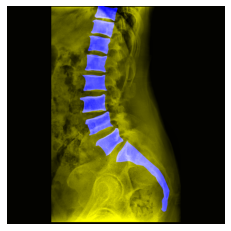

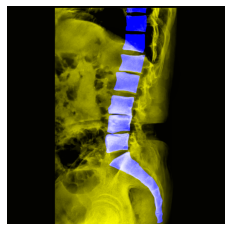

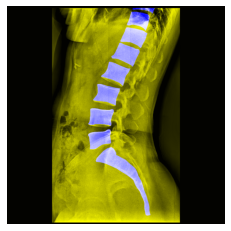

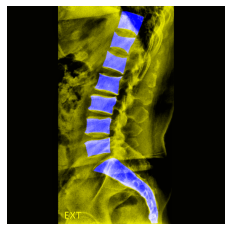

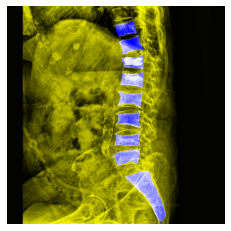

...

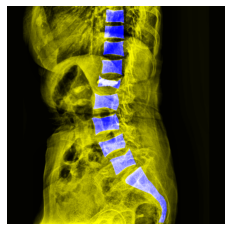

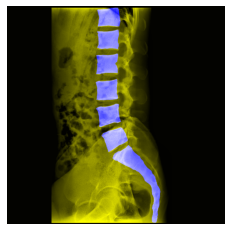

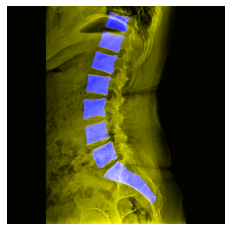

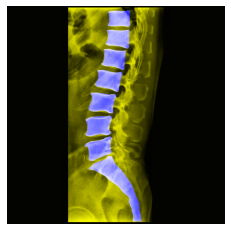

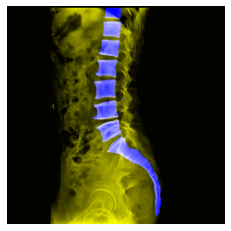

KeyboardInterrupt: 

In [99]:
#마스크와 원본 매칭
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

ori_path= sorted(glob.glob('../datasets/4th/input_random/*.png'))
mask_path=sorted(glob.glob('../datasets/4th/mask_random/*.png'))
check_path="../datasets/4th/check/"


for i in range(len(ori_path)):
    img_name = ori_path[i][ori_path[i].rindex('/')+1:ori_path[i].rindex('.')]
    img_t = load_img(ori_path[i])
    img_l = load_img(mask_path[i])
    x_t = img_to_array(img_t)            
    x_l = img_to_array(img_l)
    x_t[:,:,2] = x_l[:,:,0]
    img_tmp = array_to_img(x_t)
    
    plt.imshow(img_tmp, cmap='gray')
    plt.axis('off')
    plt.show()
    img_tmp.save(check_path+"ckeck_{}.png".format(img_name))

# 데이터 랜덤으로 섞기

In [102]:
total_path="../datasets/4th/"

input_image_list=[]
mask_image_list=[]
for dirName, subdirList, fileList in os.walk(total_path+"input_random"):
    
    for i,filename in enumerate(fileList):
        if ".png" in filename.lower():
            input_image_list.append(os.path.join(dirName,filename))
            
for dirName, subdirList, fileList in os.walk(total_path+"mask_random"):
    for i,filename in enumerate(fileList):
        if ".png" in filename.lower():
            mask_image_list.append(os.path.join(dirName,filename))
            
mask_image_list.sort()
input_image_list.sort()

print(len(input_image_list))
print(len(mask_image_list))

798
798


In [92]:
import random
result=[]
for i in range(798):
    a=random.randint(1, 798)
    while a in result :              # a가 이미 뽑은 리스트에 있을 때까지 다시 뽑자
        a = random.randint(1,798)
    result.append(a)
print(len(result))
print(result)

798
[113, 22, 188, 510, 122, 380, 436, 316, 5, 544, 473, 104, 689, 387, 691, 698, 234, 767, 602, 383, 774, 108, 90, 358, 290, 416, 452, 220, 524, 389, 266, 84, 299, 396, 677, 631, 650, 319, 179, 681, 491, 291, 707, 164, 748, 334, 225, 773, 613, 451, 139, 198, 649, 612, 548, 772, 130, 470, 46, 124, 56, 456, 6, 523, 778, 171, 210, 616, 794, 19, 80, 100, 31, 165, 687, 472, 629, 207, 620, 50, 693, 298, 540, 321, 330, 422, 268, 155, 515, 1, 214, 467, 739, 546, 785, 37, 244, 576, 537, 496, 442, 421, 578, 355, 479, 564, 521, 7, 245, 381, 390, 136, 669, 83, 16, 285, 654, 573, 529, 593, 394, 251, 725, 478, 734, 485, 741, 618, 519, 347, 648, 652, 41, 567, 271, 168, 756, 256, 167, 651, 526, 123, 486, 109, 730, 229, 202, 450, 413, 663, 735, 248, 384, 356, 665, 233, 747, 528, 106, 377, 160, 596, 273, 783, 561, 796, 391, 721, 66, 320, 69, 617, 647, 141, 408, 709, 68, 542, 372, 769, 304, 30, 186, 762, 325, 45, 156, 435, 517, 670, 15, 348, 121, 495, 150, 453, 329, 300, 509, 60, 586, 145, 275, 112, 759

In [97]:
dir_path="../datasets/4th/input_random"
result2=[]
for i, name in enumerate(input_image_list):
    
    dst = "ran_" +str(result[i])+".png"
    
    dst = os.path.join(dir_path, dst)
    os.rename(name, dst)
    
dir_path2="../datasets/4th/mask_random"
result3=[]
for i, name in enumerate(mask_image_list):
    
    dst2 = "ran_" +str(result[i])+".png"
    
    dst2 = os.path.join(dir_path3, dst2)
    os.rename(name, dst2)

# 데이터 분할

In [104]:
total_path="../datasets/4th/"

input_image_list=[]
mask_image_list=[]
for dirName, subdirList, fileList in os.walk(total_path+"input_random"):
    
    for i,filename in enumerate(fileList):
        if ".png" in filename.lower():
            input_image_list.append(os.path.join(dirName,filename))
            
for dirName, subdirList, fileList in os.walk(total_path+"mask_random"):
    for i,filename in enumerate(fileList):
        if ".png" in filename.lower():
            mask_image_list.append(os.path.join(dirName,filename))
            
mask_image_list.sort()
input_image_list.sort()

print(len(input_image_list))
print(len(mask_image_list))

798
798


In [105]:
#데이터 순서 맞는지 확인
print(input_image_list[53])
print(mask_image_list[53])

../datasets/4th/input_random/ran_147.png
../datasets/4th/mask_random/ran_147.png


In [106]:
all_case=input_image_list
all_case2=mask_image_list

all_case_arr_X=np.array(all_case)
all_case_arr_Y=np.array(all_case2)
all_case_arr_Z=all_case_arr_X.copy()

all_case_arr_Z[:len(input_image_list)]=0
all_case_arr_Z[len(input_image_list):]=1


print(len(all_case_arr_X))
print(len(all_case_arr_Y))
print(len(all_case_arr_Z))

798
798
798


In [107]:
#kf = StratifiedKFold(all_case_arr_Y,splits_number)
kf=StratifiedKFold(n_splits=5)

count=0
path="../7th_total/data"
for train_index, test_index in kf.split(all_case_arr_X,all_case_arr_Z):
    print("TRAIN:", len(train_index), "TEST:", len(test_index))

    train_x, test_x = all_case_arr_X[train_index], all_case_arr_X[test_index]
    train_y, test_y = all_case_arr_Y[train_index], all_case_arr_Y[test_index]

    #input_ori
    for i,train_x_img in enumerate(train_x):

        img=cv2.imread(train_x_img)
        filename=train_x_img.split("/")[-1]


        cv2.imwrite(path+"/%s/non_aug/train_ori/%s"%(count,filename),img)

    for i,test_x_img in enumerate(test_x):

        img=cv2.imread(test_x_img)
        filename=test_x_img.split("/")[-1]


        cv2.imwrite(path+"/%s/non_aug/test_ori/%s"%(count,filename),img)


    #input_mask
    for i,train_y_img in enumerate(train_y):

        img=cv2.imread(train_y_img)
        filename=train_y_img.split("/")[-1]


        cv2.imwrite(path+"/%s/non_aug/train_msk/%s"%(count,filename),img)

    for i,test_y_img in enumerate(test_y):

        img=cv2.imread(test_y_img)
        filename=test_y_img.split("/")[-1]


        cv2.imwrite(path+"/%s/non_aug/test_msk/%s"%(count,filename),img)

        

    count=count+1

TRAIN: 638 TEST: 160
TRAIN: 638 TEST: 160
TRAIN: 638 TEST: 160
TRAIN: 639 TEST: 159
TRAIN: 639 TEST: 159
